In [1]:
from jax import config
config.update("jax_debug_nans", False)
config.update("jax_enable_x64", True)
config.update("jax_disable_jit", False)
config.update("jax_log_compiles", False)

from pathlib import Path

from matplotlib import pyplot as plt
import numpy as np

from viperleed_jax.constants import BOHR
from viperleed_jax.lib_tensors import read_tensor
from viperleed_jax.lib_phaseshifts import *
from viperleed_jax.data_structures import ReferenceData
from viperleed_jax.tensor_calculator import TensorLEEDCalculator

%matplotlib inline

In [2]:
jax.devices()

[CpuDevice(id=0)]

In [3]:
use_installable = True
if use_installable:
    import viperleed
    from viperleed.calc import symmetry
    from viperleed.calc.files import poscar
    from viperleed.calc.files import parameters
    from viperleed.calc.classes.rparams import Rparams
    from viperleed.calc.files.beams import readIVBEAMS, readOUTBEAMS
    from viperleed.calc.files.phaseshifts import readPHASESHIFTS
    from viperleed.calc.files.vibrocc import readVIBROCC
    from viperleed.calc.files.iorfactor import beamlist_to_array
    from viperleed.calc.lib.leedbase import getBeamCorrespondence
else:
    # master
    import sys
    sys.path.append('/Users/alexander/GitHub/')
    import viperleed
    from viperleed.tleedmlib.files import poscar
    from viperleed.tleedmlib.files import parameters
    from viperleed.tleedmlib.classes.rparams import Rparams
    from viperleed.tleedmlib.files.beams import readIVBEAMS, readOUTBEAMS
    from viperleed.tleedmlib.files.phaseshifts import readPHASESHIFTS
    from viperleed.tleedmlib.files.vibrocc import readVIBROCC
    from viperleed.tleedmlib.files.iorfactor import beamlist_to_array

In [4]:
data_path = Path('tests') / 'test_data' / 'Fe2O3_012'

In [5]:
# Read in data from POSCAR and PARAMETERS files
slab = poscar.read(data_path / 'POSCAR')
rparams = parameters.read(data_path / 'PARAMETERS')
parameters.interpret(rparams, slab, silent=False)
slab.full_update(rparams)

# reading IVBEAMS
# rparams.ivbeams = readIVBEAMS(data_path / 'IVBEAMS')
# beam_indices = np.array([beam.hk for beam in rparams.ivbeams])

# reading VIBROCC
readVIBROCC(rparams, slab, data_path / 'VIBROCC')

# incidence angles
rparams.THETA = 0.0
rparams.PHI = 90.0

In [6]:
LMAX = rparams.LMAX.max

In [7]:
param_energies = np.linspace(rparams.THEO_ENERGIES.start,
                           rparams.THEO_ENERGIES.stop,
                           rparams.THEO_ENERGIES.n_energies)

# Experimental Data

In [8]:
expbeams = readOUTBEAMS(data_path / 'EXPBEAMS.csv')
exp_energies, _, _, exp_intensities = beamlist_to_array(expbeams)

In [9]:
theobeams = readOUTBEAMS(data_path / 'THEOBEAMS.csv')
theo_energies, _, _, theo_intensities = beamlist_to_array(theobeams)

In [10]:
beam_indices = ((1.00000,  0.00000), (1.00000,  1.00000), (1.00000, -1.00000), (0.00000,  2.00000), (0.00000, -2.00000), (2.00000,  0.00000), (1.00000,  2.00000), (1.00000, -2.00000), (2.00000,  1.00000), (2.00000, -1.00000), (2.00000,  2.00000), (2.00000, -2.00000), (1.00000,  3.00000), (1.00000, -3.00000), (3.00000,  0.00000), (3.00000,  1.00000), (3.00000, -1.00000), (2.00000,  3.00000), (2.00000, -3.00000), (3.00000,  2.00000), (3.00000, -2.00000), (0.00000,  4.00000), (0.00000, -4.00000), (1.00000,  4.00000), (1.00000, -4.00000), (4.00000,  0.00000), (3.00000,  3.00000), (3.00000, -3.00000), (4.00000,  1.00000), (4.00000, -1.00000), (2.00000,  4.00000), (4.00000,  2.00000), (1.00000,  5.00000), (4.00000,  3.00000), (4.00000, -3.00000), (4.00000,  4.00000), (3.00000,  5.00000), (0.00000, -6.00000), )

In [11]:
corr = [np.argmax([b == t.hk for t in expbeams])for b in beam_indices]

# Tensor files

In [12]:
read_tensor_num = lambda num: read_tensor(data_path / 'Tensors' / f'T_{num}',
                                          n_beams=len(beam_indices),
                                        n_energies=param_energies.size,
                                        l_max=LMAX+1)
non_bulk_atoms = [at for at in slab.atlist if not at.is_bulk]
tensors = [read_tensor_num(at.num) for at in non_bulk_atoms]

ref = ReferenceData(tensors, fix_lmax=10)

#delete tensors to free up memory
for t in tensors:
    del t
del tensors

In [13]:
# read phase shifts
phaseshifts_path = data_path /  'PHASESHIFTS'
_, raw_phaseshifts, _, _ = readPHASESHIFTS(
    slab, rparams, readfile=phaseshifts_path, check=True, ignoreEnRange=False)


In [14]:
# TODO: site_indices needs a general solution once we implement chemical pertubations
site_indices = [0,0,1,1,1,1,1,1,1,1,1,1,2,2,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3]

In [15]:
# TODO: with this current implementation, we can not treat chemical
#       pertubations, nor vacancies. We need to implement this.
#       See e.g. iodeltas.generateDeltaInput()
#       (Treating vacancies requires setting zeros for that site)

phaseshifts = Phaseshifts(raw_phaseshifts, ref.energies, LMAX, site_indices)

# Calculator set up

In [16]:
calculator = TensorLEEDCalculator(ref, phaseshifts, slab, rparams, beam_indices)

centered_vib_amps = calculator.ref_vibrational_amps
centered_displacements = np.array([[0.0, 0.0, 0.0],]*30)

In [17]:
v0r_range = (-3.5, +3.5) # in eV
vib_amp_range = (-0.1, +0.1) # in A
geo_range = (-0.1, +0.1) # in A

In [18]:
centered_reduced_vib_amps = np.array([0.089, 0.06, 0.141, 0.115])
centered_reduced_displacements = np.array([[0.0],]*5).flatten()

In [19]:
calculator.parameter_transformer.set_vib_amp_bounds(centered_reduced_vib_amps + vib_amp_range[0], centered_reduced_vib_amps + vib_amp_range[0])
calculator.parameter_transformer.set_v0r_bounds(*v0r_range)
calculator.parameter_transformer.set_displacement_bounds(centered_reduced_displacements + geo_range[0], centered_reduced_displacements + geo_range[1])

In [20]:
# read tensor files for non-bulk atoms
non_bulk_atoms = [at for at in slab.atlist if not at.is_bulk]

In [21]:
# vibration constraints to change all sites together
every_second_site = site_indices[::2] # for Fe2O3, every 2nd atom is symmetry independent
vib_constraints = np.zeros(shape=(calculator.parameter_transformer.n_irreducible_vib_amps, max(every_second_site)+1))
for at_id, site in enumerate(every_second_site):
    vib_constraints[at_id, site] = 1.0

In [22]:
# geometric constraints to move only z for the topmost layer (*L(1) z) in viperleed
atoms_in_first_layer = [0, 1, 8, 9, 10]
geo_constraints = np.zeros(shape=(calculator.parameter_transformer.n_irreducible_displacements, len(atoms_in_first_layer)))
for at_id, site in enumerate(atoms_in_first_layer):
    geo_constraints[site*3, at_id] = 1.0

In [23]:
# apply constraints
calculator.parameter_transformer.apply_geo_constraints(geo_constraints)
calculator.parameter_transformer.apply_vib_constraints(vib_constraints)

In [24]:
print(calculator.parameter_transformer.info)

Constrained parameters:
10	(5 geo, 4 vib, 1 V0r)
Symmetry irreducible parameters:
61	(45 geo, 15 vib, 1 V0r)
Reducible parameters:
121	(90 geo, 30 vib, 1 V0r)



In [25]:
calculator.exp_spline

In [26]:
test_flat_param = np.array([0.6, 0.5, 0.5, 0.5, 0.5, 0.501]+ [0.5]*4) # displacements

In [27]:
intens = calculator._intensity_from_reduced(test_flat_param)

theta: 0.0
theta: 0.0
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
phi: -0.0
phi: -0.0
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795

In [28]:
spline_coeffs = calculator.interpolator.get_bspline_coeffs(intens)
orig = calculator.interpolator.evaluate_bspline_coeffs(spline_coeffs)

AttributeError: 'TensorLEEDCalculator' object has no attribute 'interpolator'

In [ ]:
calculator.interpolator = CardinalNotAKnotSplineInterpolator(
            calculator.interpolator.origin_grid,
            calculator.target_grid,
            calculator.interpolation_deg # TODO: take from rparams.INTPOL_DEG
        )

In [ ]:
import interpax

In [ ]:
spline = interpax.CubicSpline(calculator.interpolator.origin_grid,
                     intens)

In [ ]:
spline.derivative()

CubicSpline(_c=f64[3,200,38], _x=f64[201], _extrapolate=True, _axis=0)

-2


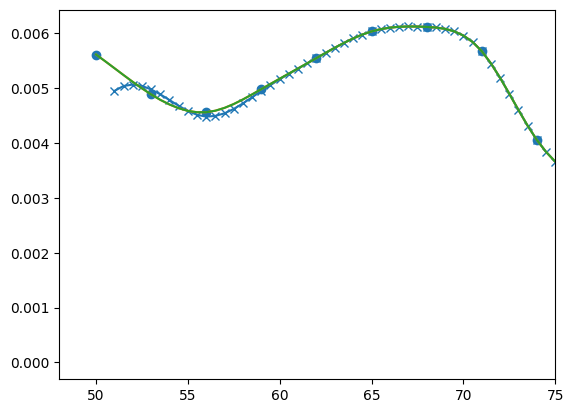

In [ ]:
b_coeffs = calculator.interpolator.get_bspline_coeffs(intens)
orig = calculator.interpolator.evaluate_bspline_coeffs(b_coeffs)
pp_coeffs = calculator.interpolator.convert_b_to_pp_spline_coeffs(b_coeffs)
res = calculator.interpolator.evaluate_pp_spline_coeffs(pp_coeffs, 0, -1)
#res_2 = evaluate_pp_spline_coeffs(calculator.interpolator, a.copy(), 0, -1.5)

e = calculator.interpolator.target_grid

%matplotlib inline
plt.plot(e, res[0,:], marker='x')
#plt.plot(res_2[0,:])
plt.plot(e, orig[:,0])
plt.xlim([48,75])
plt.scatter(calculator.interpolator.origin_grid, intens[:,0])
#plt.ylim([0,0.01])

plt.plot(e, spline(e)[:,0])

plt.show()

In [ ]:
inten

NameError: name 'inten' is not defined

In [ ]:
import interpax

In [ ]:
%%timeit
b_coeffs = calculator.interpolator.get_bspline_coeffs(intens)
orig = calculator.interpolator.evaluate_bspline_coeffs(b_coeffs)
pp_coeffs = calculator.interpolator.convert_b_to_pp_spline_coeffs(b_coeffs)
res = calculator.interpolator.evaluate_pp_spline_coeffs(pp_coeffs, 0, -1)


-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
-2
16.4 ms ± 2.15 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [ ]:
interpax

NameError: name 'interpax' is not defined

In [ ]:
x = calculator.interpolator.origin_grid
y = intens
def f(x, y):
    return interpax.CubicSpline(x, y, check=False)

f = jax.jit(f)

In [ ]:
f(x, y)

CubicSpline(_c=f64[4,200,38], _x=f64[201], _extrapolate=True, _axis=0)

In [ ]:
%timeit f(x, y)

960 µs ± 19.3 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


# Other thing

In [ ]:
print(intens.shape)
_intens = intens[:, 0]

(201, 38)


In [ ]:
n_values = len(intens)
first_col_row = jnp.array([4.0, 1.0] + [0.0]* (n_values-4))
mat = 1/3*scipy.linalg.toeplitz(first_col_row, first_col_row)
mat

step = 3.0
divided_diff = jnp.diff(_intens)/step

_c = jnp.linalg.solve(mat, jnp.diff(divided_diff)/step)

In [ ]:
# natural bc
coeffs = jnp.pad(_c, (1,1), 'constant')
coeffs

a_i = jnp.diff(coeffs)/(3*step)
c_i = divided_diff  - 2/3*coeffs[:-1]*step -1/3*jnp.roll(coeffs, 1)[:-1]*step
b_i = coeffs[:-1]
d_i = _intens[:-1]

In [ ]:
a_i.shape, b_i.shape, c_i.shape, d_i.shape

((200,), (200,), (200,), (200,))

In [ ]:
pp_coeffs

Array([[[-3.46535092e-05,  6.93070184e-05, -3.16983448e-05, ...,
          1.90605477e-07, -1.04224860e-07,  5.19922843e-08],
        [ 4.15841615e-04, -5.19802142e-04,  6.84985976e-05, ...,
         -1.04190887e-06,  7.80604395e-07, -1.55976853e-07],
        [-1.66336448e-03, -1.03958546e-04,  3.78870231e-05, ...,
          2.90930067e-06,  1.55253005e-07,  1.55976853e-07],
        [ 2.21781666e-03,  5.23265512e-03,  5.45936540e-03, ...,
          4.95443981e-06,  5.72152445e-07, -5.19922843e-08]],

       [[-9.30326009e-06,  1.86065202e-05, -1.32271135e-05, ...,
          1.20059764e-06, -2.99855857e-06,  1.52328894e-06],
        [ 1.11638988e-04, -1.39548768e-04,  7.49959652e-05, ...,
         -1.68791985e-05,  2.27052544e-05, -4.56986681e-06],
        [-4.46555420e-04, -2.79092483e-05, -2.16254295e-04, ...,
          7.25817919e-05,  4.71383762e-06,  4.56986681e-06],
        [ 5.95406518e-04,  1.40478562e-03,  1.76754993e-03, ...,
          1.50036351e-04,  1.67080719e-05, -1.52328

In [ ]:
calculator.interpolator.knots

array([ 49.99998652,  49.99998652,  49.99998652,  49.99998652,
        55.99998184,  58.99998193,  61.99997632,  64.99997967,
        67.99997569,  70.99997659,  73.99998073,  76.99997596,
        79.99997439,  82.99997853,  85.99997134,  88.99996898,
        91.99996907,  94.99997158,  97.99996841, 100.99997257,
       103.99996292, 106.99996705, 109.99995985, 112.99995993,
       115.99995513, 118.99995847, 121.99995773, 124.99995295,
       127.99995385, 130.99994503, 133.99994998, 136.99996303,
       139.9999477 , 142.99995265, 145.99995436, 148.9999439 ,
       151.99994237, 154.99995624, 157.99993522, 160.99994667,
       163.99994352, 166.99993954, 169.99994693, 172.99994378,
       175.99993087, 178.99994312, 181.99993916, 184.99992625,
       187.99993608, 190.99993454, 193.99993543, 196.99992904,
       199.99993804, 202.99992758, 205.99992928, 208.99993018,
       211.99991243, 214.99993359, 217.99993692, 220.99991591,
       223.99993952, 226.99992097, 229.99992997, 232.99

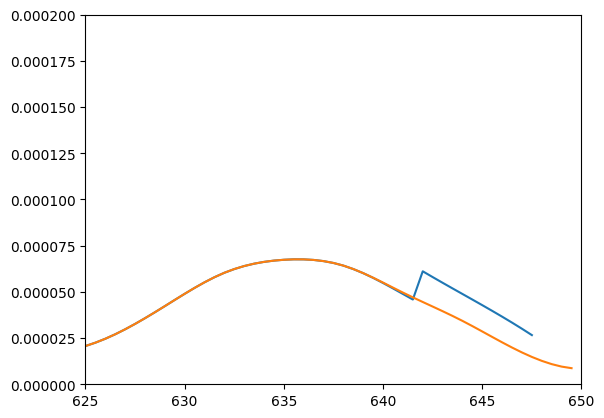

In [ ]:
plt.plot(e, res[0,:])
#plt.plot(res_2[0,:])
plt.plot(e, orig[:,0])
plt.xlim([625,650])
plt.ylim([0,0.0002])

plt.show()

In [ ]:
calculator.interpolator.x_diffs[2, :20]

Array([2.15998038e+02, 1.66373352e+02, 1.24998638e+02, 9.11238965e+01,
       6.39991281e+01, 4.28743325e+01, 2.69995096e+01, 1.56246594e+01,
       7.99978204e+00, 3.37487740e+00, 9.99945509e-01, 1.24986378e-01,
       2.69995121e+01, 1.56246611e+01, 7.99978314e+00, 3.37487801e+00,
       9.99945784e-01, 1.24986446e-01, 2.69993606e+01, 1.56245560e+01],      dtype=float64)

In [ ]:
calculator.interpolator.knots

array([ 49.99998652,  49.99998652,  49.99998652,  49.99998652,
        55.99998184,  58.99998193,  61.99997632,  64.99997967,
        67.99997569,  70.99997659,  73.99998073,  76.99997596,
        79.99997439,  82.99997853,  85.99997134,  88.99996898,
        91.99996907,  94.99997158,  97.99996841, 100.99997257,
       103.99996292, 106.99996705, 109.99995985, 112.99995993,
       115.99995513, 118.99995847, 121.99995773, 124.99995295,
       127.99995385, 130.99994503, 133.99994998, 136.99996303,
       139.9999477 , 142.99995265, 145.99995436, 148.9999439 ,
       151.99994237, 154.99995624, 157.99993522, 160.99994667,
       163.99994352, 166.99993954, 169.99994693, 172.99994378,
       175.99993087, 178.99994312, 181.99993916, 184.99992625,
       187.99993608, 190.99993454, 193.99993543, 196.99992904,
       199.99993804, 202.99992758, 205.99992928, 208.99993018,
       211.99991243, 214.99993359, 217.99993692, 220.99991591,
       223.99993952, 226.99992097, 229.99992997, 232.99

In [ ]:
calculator.interpolator.knots, calculator.interpolator.origin_grid

(array([ 49.99998652,  49.99998652,  49.99998652,  49.99998652,
         55.99998184,  58.99998193,  61.99997632,  64.99997967,
         67.99997569,  70.99997659,  73.99998073,  76.99997596,
         79.99997439,  82.99997853,  85.99997134,  88.99996898,
         91.99996907,  94.99997158,  97.99996841, 100.99997257,
        103.99996292, 106.99996705, 109.99995985, 112.99995993,
        115.99995513, 118.99995847, 121.99995773, 124.99995295,
        127.99995385, 130.99994503, 133.99994998, 136.99996303,
        139.9999477 , 142.99995265, 145.99995436, 148.9999439 ,
        151.99994237, 154.99995624, 157.99993522, 160.99994667,
        163.99994352, 166.99993954, 169.99994693, 172.99994378,
        175.99993087, 178.99994312, 181.99993916, 184.99992625,
        187.99993608, 190.99993454, 193.99993543, 196.99992904,
        199.99993804, 202.99992758, 205.99992928, 208.99993018,
        211.99991243, 214.99993359, 217.99993692, 220.99991591,
        223.99993952, 226.99992097, 229.

In [ ]:
calculator.interpolator.x_diffs

Array([[5.99998184e+00, 5.49998184e+00, 4.99998184e+00, ...,
        1.49977103e+00, 9.99771031e-01, 4.99771031e-01],
       [3.59997820e+01, 3.02498002e+01, 2.49998184e+01, ...,
        2.24931315e+00, 9.99542115e-01, 2.49771084e-01],
       [2.15998038e+02, 1.66373352e+02, 1.24998638e+02, ...,
        3.37345470e+00, 9.99313251e-01, 1.24828352e-01]], dtype=float64)

In [ ]:
# Basis transformation from cradinal B-spline to cardinal piecewise polynomial
# in the form as given by de Boor, A practical guide to splines 1978, p.324
B_TO_PP_SPLINE_BASIS_TRANSFORMATION = np.array([[1/6, 2/3, 1/6, 0.0],
                                                [-1/2, 0.0, 1/2, 0.0],
                                                [1.0, -2.0, 1.0, 0.0],
                                                [-1.0, 3.0, -3.0, 1.0]])

def translate_cubic_pp_spline_coeffs(s):
    """Returns a transformation matrix that translates spline coeffiecients.

    The return transformation can be applied to the coefficients (a,b,c,d) of a
    cubic (spline) in the piecewise-polynomial basis, i.e.:
    f_i(x) = a*x**3 + b*x**2 + c*x + d
    The resulting set of coefficients yields the coefficents for g(x) = f(x-s).
    Note that for s->0, the transformation approaches unity.
    Note also that for a piecewise polynomial splines, this shift in only valid
    while x+s is in the same knot-interval as the x.

    Parameters
    ----------
    d : float
        The amount to translate the coefficients.

    Returns
    -------
    ndarray
        The transformation in the form of a (4x4) matrix.
    """
    return np.array([[1.0, 0.0, 0.0, 0.0],
                     [3*s, 1.0, 0.0, 0.0],
                     [3*s**2, 2*s, 1.0, 0.0],
                     [s**3, s**2, s, 1.0]])


In [ ]:
convert_b_to_pp_spline_coeffs(c, 0.5).shape

(38, 4, 201)

In [ ]:
from functools import partial
@partial(jax.vmap, in_axes=(1, None))
def convert_b_to_pp_spline_coeffs(bspline_coeffs, step):
    """Converts B-spline to piecewise polynomial coefficents."""

    a = jnp.convolve(bspline_coeffs,
                    B_TO_PP_SPLINE_BASIS_TRANSFORMATION[3, :])[2:-1]/step**3
    a  =a/6

    b = jnp.convolve(bspline_coeffs,
                    B_TO_PP_SPLINE_BASIS_TRANSFORMATION[2, :])[2:-1]/step**2
    b = (b-6*a)/2

    c = jnp.convolve(bspline_coeffs,
                    B_TO_PP_SPLINE_BASIS_TRANSFORMATION[1, :])[2:-1]/step
    c = c- 3*a -2*b

    d = jnp.convolve(bspline_coeffs,
                    B_TO_PP_SPLINE_BASIS_TRANSFORMATION[0, :])[2:-1]
    d = d - a - b- c
    return jnp.array([a, b, c, d])

In [ ]:
def translate_bspline_coeffs(bspline_coeffs, shift):
    piecewise_translator = translate_cubic_pp_spline_coeffs(shift)

    transformation = (jnp.linalg.inv(B_TO_PP_SPLINE_BASIS_TRANSFORMATION)
                        @piecewise_translator
                        @B_TO_PP_SPLINE_BASIS_TRANSFORMATION)

    #trafo_eigen_vec = jnp.linalg.eig(transformation)[1][0,:]
    trafo_eigen_vec = transformation[1,:]
    trafo_eigen_vec = trafo_eigen_vec

    translated_bspline_coeffs = np.array(
        [np.convolve(bspline_coeffs[:, beam], trafo_eigen_vec, 'full')
        for beam in range(bspline_coeffs.shape[1])]
    ).swapaxes(0,1)
    # remove added dummy coeffs from convolution
    translated_bspline_coeffs = translated_bspline_coeffs[1:-2]
    return translated_bspline_coeffs, transformation

In [ ]:
def evaluate_bspline_coeffs(self, bspline_coeffs, knot_shift=0, deriv_order=0):
    """Evaluate spline using the De Boor and the B-spline coefficients"""
    # Extract the relevant coefficients for each interval
    lower_indices = self.intervals - self.intpol_deg
    lower_indices = jnp.roll(lower_indices, knot_shift)
    coeff_indices = lower_indices.reshape(-1,1) + jnp.arange(self.intpol_deg+1)
    coeff_subarrays = bspline_coeffs[coeff_indices]

    # Element-wise multiplication between coefficients and de_boor values
    # then sum over basis functions
    return jnp.einsum('ijb,ji->ib',
                        coeff_subarrays,
                        jnp.roll(calculator.interpolator.de_boor_coeffs[deriv_order],
                                knot_shift))

In [ ]:
delta = -0.1
step = 0.5

knot_shift, frac_shift = divmod(delta, step)
knot_shift = int(knot_shift)
c = calculator.interpolator.get_bspline_coeffs(intens)
s, T = translate_bspline_coeffs(c, -frac_shift)

NameError: name 'translate_bspline_coeffs' is not defined

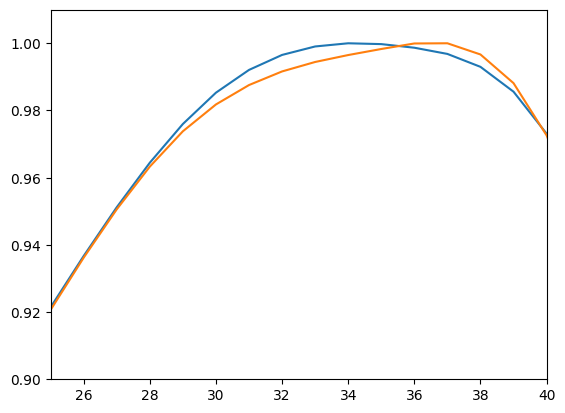

In [ ]:
orig = evaluate_bspline_coeffs(calculator.interpolator, c)
shifted = evaluate_bspline_coeffs(calculator.interpolator, s, knot_shift=knot_shift)

%matplotlib inline
plt.plot(orig[:,0] / np.max(orig[:,0]))
plt.plot(shifted[:,0] / np.max(shifted[:,0]))
plt.xlim([25,40])
plt.ylim([0.9,1.01])
plt.show()


In [ ]:
orig[:,0]/shifted[:,0]

Array([1., 1., 1., ..., 1., 1., 1.], dtype=float64)

In [ ]:
c.shape, s.shape

((201, 38), (201, 38))

In [ ]:
orig = calculator.interpolator.evaluate_bspline_coeffs(c)

In [ ]:
spline_coeffs = get_bspline_coeffs(calculator.interpolator, intens)

NameError: name 'get_bspline_coeffs' is not defined

In [ ]:
delta = 2.5
step = 3.0

knot_shift, frac_shift = divmod(delta, step)
knot_shift = int(knot_shift)

intervals = np.arange(201)
coeffs = calculator.interpolator.de_boor_coeffs[0, ...] # non-derivative coeffs


first_order = coeffs[3-1, intervals] - coeffs[3-1, intervals+1]
second_order = 0.5*coeffs[3-2, intervals] + coeffs[3-2, intervals+1 ] + 0.5*coeffs[3-2, intervals+2]
third_order = np.full_like(first_order, fill_value=1.)

corr = frac_shift/step * first_order + (frac_shift/step)**2 * second_order + (frac_shift/step)**3 * third_order
corr = 1/3*np.array(corr)

In [ ]:
frac_shift

2.5

In [ ]:
interpolator.de_boor_coeffs.shape

(3, 4, 1200)

In [ ]:
corr = frac_shift/step

In [ ]:
shifted_spline_coeffs = np.roll(spline_coeffs, knot_shift, axis=0)
# invalidate values:
nan_mask = jnp.full_like(corr, fill_value=1.0)
#nan_mask = nan_mask.at[:knot_shift].set(jnp.nan)

In [ ]:
alpha_t = jnp.einsum('ib,->ib', shifted_spline_coeffs, (1+corr))
lower_indices = calculator.interpolator.intervals - calculator.interpolator.intpol_deg
coeff_indices = lower_indices.reshape(-1,1) + jnp.arange(calculator.interpolator.intpol_deg+1)
coeff_subarrays = alpha_t[coeff_indices]

In [ ]:
deriv_order = 0

res = jnp.einsum('ijb,ji->ib',
                      coeff_subarrays,
                      calculator.interpolator.de_boor_coeffs[deriv_order])

NameError: name 'coeff_subarrays' is not defined

In [ ]:
b_to_pp_matrix = np.array([[1/6, 2/3, 1/6, 0.0],
                           [-1/2, 0.0, 1/2, 0.0],
                           [1.0, -2.0, 1.0, 0.0],
                           [-1.0, 3.0, -3.0, 1.0]])

In [ ]:
def shift_matrix(d):
    return np.array([[1, 0, 0, 0],
                     [3*d, 1, 0, 0],
                     [3*d**2, 2*d, 1, 0],
                     [d**3, d**2, d, 1]])


In [ ]:
np.linalg.eig(R)[1][:,0]

NameError: name 'R' is not defined

In [ ]:
delta = -15.3
step = 0.5

knot_shift, frac_shift = divmod(delta, step)
knot_shift = int(knot_shift)

R = np.linalg.inv(b_to_pp_matrix)@shift_matrix(frac_shift)@b_to_pp_matrix

R_vec = np.linalg.eig(R)[1][:,0]
t_coeffs = np.array([np.convolve(spline_coeffs[:, beam], R_vec)
                    for beam in range(spline_coeffs.shape[1])])

NameError: name 'b_to_pp_matrix' is not defined

In [ ]:
b = spline_coeffs[:, 0]
b.shape

(38,)

In [ ]:
spline_coeffs = calculator.interpolator.get_bspline_coeffs(intens)

In [ ]:
lower_indices = calculator.interpolator.intervals - calculator.interpolator.intpol_deg
lower_indices = np.roll(lower_indices, knot_shift)
coeff_indices = lower_indices.reshape(-1,1) + jnp.arange(calculator.interpolator.intpol_deg+1)
coeff_subarrays = t_coeffs.swapaxes(0,1)[coeff_indices, :]


deriv_order = 0

res = jnp.einsum('ijb,ji->ib',
                      coeff_subarrays,
                      np.roll(calculator.interpolator.de_boor_coeffs[deriv_order],
                              knot_shift))

NameError: name 't_coeffs' is not defined

In [ ]:
plt.plot(res[:,0])
plt.plot(orig[:,0])

NameError: name 'res' is not defined

In [ ]:
from matplotlib import animation

In [ ]:
t_coeffs.shape, coeff_indices

NameError: name 't_coeffs' is not defined

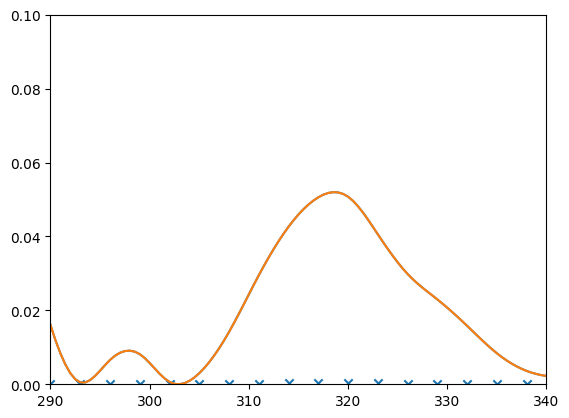

In [ ]:
fig = plt.figure()


n_frames = 201

def update(delta_i):
    plt.cla()
    delta = -9 + 13.5/n_frames*delta_i
    step = 0.5

    knot_shift, frac_shift = divmod(delta, step)
    knot_shift = int(knot_shift)
    #frac_shift += 3.0
    R = np.linalg.inv(b_to_pp_matrix)@shift_matrix(frac_shift)@b_to_pp_matrix

    R_vec = R[3,:]
    #R_vec = R_vec/np.linalg.norm(R)
    t_coeffs = np.array([np.convolve(spline_coeffs[:, beam], R_vec)
                        for beam in range(spline_coeffs.shape[1])])

    lower_indices = calculator.interpolator.intervals - calculator.interpolator.intpol_deg
    lower_indices = np.roll(lower_indices, knot_shift)
    coeff_indices = lower_indices.reshape(-1,1) + jnp.arange(calculator.interpolator.intpol_deg+1)

    coeff_subarrays = t_coeffs.swapaxes(0,1)[coeff_indices, :]

    deriv_order = 0

    res = jnp.einsum('ijb,ji->ib',
                        coeff_subarrays,
                        np.roll(calculator.interpolator.de_boor_coeffs[deriv_order],
                                knot_shift))
    
    plt.plot(calculator.interpolator.target_grid, res[:,0]/np.max(res[:,0]), marker='')
    plt.plot(calculator.interpolator.target_grid, orig[:, 0]/np.max(orig[:,0]))
    plt.scatter(calculator.interpolator.origin_grid, intens[:,0], marker='x')

    plt.xlim([290,340])
    plt.ylim([0, 0.1])

ani = animation.FuncAnimation(fig, update, frames=n_frames, interval=15)
ani.save('animate_bspline.gif')

In [ ]:
spline_coeffs.shape

(201,)

(0.0, 0.002)

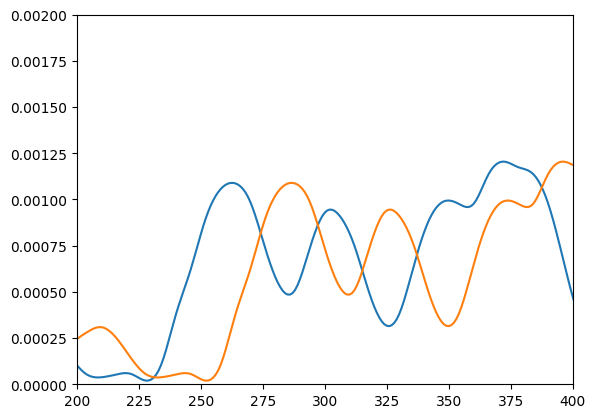

In [ ]:
plt.plot(res[:,0])
plt.plot(orig[:,0])

plt.xlim([200, 400])
plt.ylim([0, 0.002])

In [ ]:
R.trace()

4.0

In [ ]:
spline_coeffs

Array([[ 5.61384173e-03,  1.50712095e-03,  2.27332419e-03, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 5.13510739e-03,  2.14278218e-03,  2.10063585e-03, ...,
         1.13103873e-17,  4.86381319e-19, -4.72907376e-19],
       [ 4.18941651e-03,  2.17759578e-03,  1.56616590e-03, ...,
        -2.26208113e-17, -9.72764210e-19,  9.45816281e-19],
       ...,
       [ 3.07611590e-05,  2.17833163e-04,  5.25868545e-04, ...,
         4.38571467e-04,  2.15125501e-04,  1.29421546e-04],
       [ 8.38378288e-06,  2.54550723e-04,  5.09316493e-04, ...,
         5.27485450e-04,  1.19434717e-04,  1.79037639e-04],
       [ 8.42270992e-06,  2.46771632e-04,  5.08028268e-04, ...,
         4.99210422e-04,  1.51512676e-04,  1.95514761e-04]],      dtype=float64)

In [ ]:
spline_coeffs.shape

(201, 38)

In [ ]:
a = np.convolve(spline_coeffs[:, 0], b_to_pp_matrix[3, :])[2:-1]/step**3
a  =a/6

b = np.convolve(spline_coeffs[:, 0], b_to_pp_matrix[2, :])[2:-1]/step**2
b = (b-6*a)/2

c = np.convolve(spline_coeffs[:, 0], b_to_pp_matrix[1, :])[2:-1]/step
c = c- 3*a -2*b

d = np.convolve(spline_coeffs[:, 0], b_to_pp_matrix[0, :])[2:-1]
d = d - a - b- c



In [ ]:
interpolator = calculator.interpolator

In [ ]:
x_diffs = interpolator.knots[interpolator.intervals+1] - interpolator.target_grid

In [ ]:
intervals = interpolator.intervals

In [ ]:
r = a[intervals]*x_diffs**3 + b[intervals]*x_diffs**2 + c[intervals]*x_diffs + d[intervals]

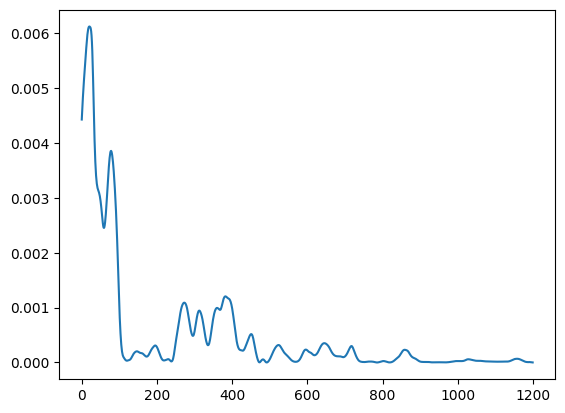

In [ ]:
plt.plot(a[intervals]*x_diffs**3 + b[intervals]*x_diffs**2 + c[intervals]*x_diffs + d[intervals])

In [ ]:
orig = calculator.interpolator.evaluate_bspline_coeffs(spline_coeffs)

In [ ]:
pp_coeffs = np.array([a,b,c,d])

In [ ]:
delta = 0.4
step = 0.5

knot_shift, frac_shift = divmod(delta, step)
knot_shift = int(knot_shift)


In [ ]:
intervals

Array([  3,   3,   3, ..., 200, 200, 200], dtype=int32)

In [ ]:
intervals = jnp.clip(jnp.searchsorted(interpolator.knots,
                                              interpolator.target_grid,
                                              side='left'),
                        a_min=interpolator.intpol_deg + 1,
                        a_max=interpolator.knots.size - interpolator.intpol_deg - 1) - 1

In [ ]:
_a, _b, _c, _d = np.roll(shift_matrix(-frac_shift)@pp_coeffs, shift=-knot_shift)

(0.002, 0.005)

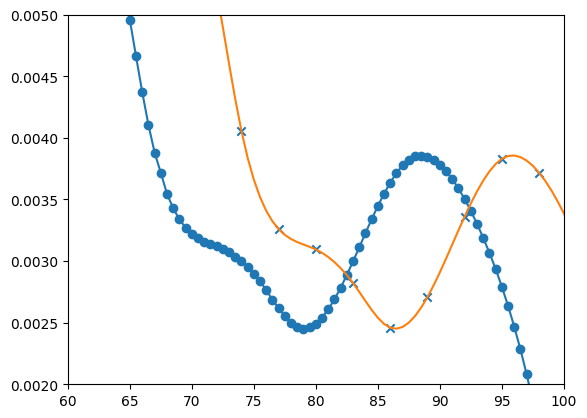

In [ ]:


_a, _b, _c, _d = np.roll(shift_matrix(-frac_shift)@pp_coeffs, shift=-knot_shift)


#plt.plot(calculator.interpolator.target_grid, a[intervals]*x_diffs**3 + b[intervals]*x_diffs**2 + c[intervals]*x_diffs + d[intervals], marker='o')
plt.plot(calculator.interpolator.target_grid, _a[intervals]*x_diffs**3 + _b[intervals]*x_diffs**2 + _c[intervals]*x_diffs + _d[intervals], marker='o')
plt.plot(calculator.interpolator.target_grid, orig[:, 0])
plt.scatter(calculator.interpolator.origin_grid, intens[:,0], marker='x')

plt.xlim([60,100])
plt.ylim([0.002, 0.005])

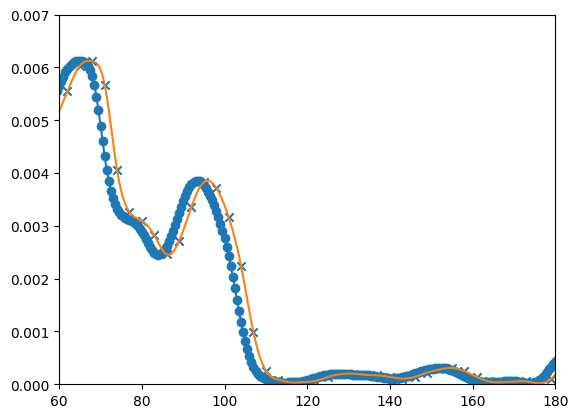

In [ ]:
fig = plt.figure()

n_frames = 151

def update(delta_i):
    plt.cla()
    delta = -4.5 + 9/n_frames*delta_i
    step = 0.5

    knot_shift, frac_shift = divmod(delta, step)
    knot_shift = int(knot_shift)
    _intervals = np.roll(intervals, -knot_shift)
    #_intervals = intervals
    _x_diffs = np.roll(x_diffs, -knot_shift)
    #_x_diffs = x_diffs
    
    _a, _b, _c, _d = np.roll(shift_matrix(-frac_shift)@pp_coeffs, shift=0)
    #_a, _b, _c, _d = np.roll(shift_matrix(-frac_shift)@pp_coeffs, shift=-knot_shift)
    #x_diff = x_diffs + frac_shift
    #plt.plot(calculator.interpolator.target_grid, a[intervals]*x_diffs**3 + b[intervals]*x_diffs**2 + c[intervals]*x_diffs + d[intervals])
    plt.plot(calculator.interpolator.target_grid, _a[_intervals]*_x_diffs**3 + _b[_intervals]*_x_diffs**2 + _c[_intervals]*_x_diffs + _d[_intervals], marker='o')
    plt.plot(calculator.interpolator.target_grid, orig[:, 0])
    plt.scatter(calculator.interpolator.origin_grid, intens[:,0], marker='x')

    plt.xlim([60,180])
    plt.ylim([0, 0.007])

ani = animation.FuncAnimation(fig, update, frames=n_frames, interval=20)
ani.save('animate.gif')

In [ ]:
shift_matrix(0.001)

array([[1.e+00, 0.e+00, 0.e+00, 0.e+00],
       [3.e-03, 1.e+00, 0.e+00, 0.e+00],
       [3.e-06, 2.e-03, 1.e+00, 0.e+00],
       [1.e-09, 1.e-06, 1.e-03, 1.e+00]])

In [ ]:
g = calculator.interpolator.origin_grid

p = a + b + c +d

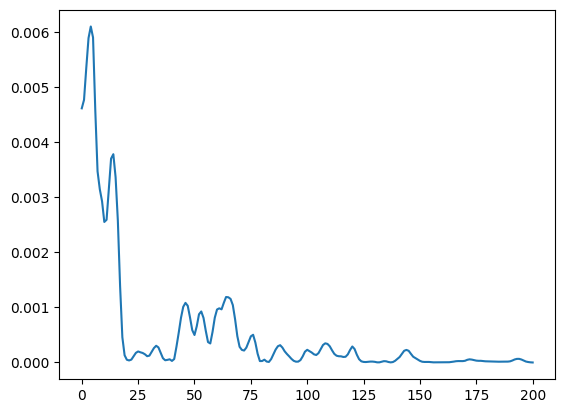

In [ ]:
plt.plot(p)

In [ ]:
shifted_spline_coeffs

(201, 38)

In [ ]:
corr

0.9666666666666667

In [ ]:
calculator.comp_energies

array([ 30. ,  30.5,  31. , ..., 749. , 749.5, 750. ])

In [ ]:
from viperleed_jax.interpolation import evaluate_spline

In [ ]:
def evaluate_spline(spline_coeffs, interpolator, deriv_order=0):
    """Evaluate the spline using the De Boor coefficients and the B-spline coefficients"""
    # Extract the relevant coefficients for each interval
    lower_indices = interpolator.intervals - interpolator.intpol_deg
    coeff_indices = lower_indices.reshape(-1,1) + jnp.arange(interpolator.intpol_deg+1)
    coeff_subarrays = spline_coeffs[coeff_indices]

    # Element-wise multiplication between coefficients and de_boor values, sum over basis functions
    return jnp.einsum('ijb,ji->ib',
                      coeff_subarrays,
                      interpolator.de_boor_coeffs[deriv_order])

In [ ]:
evaluate_spline

<function src.interpolation.evaluate_spline(spline_coeffs, interpolator, deriv_order=0)>

## Set experimental intensities as reference

In [29]:
aligned_exp_intensities = exp_intensities[:, corr]
# set reference point
calculator.set_experiment_intensity(aligned_exp_intensities,
                                    exp_energies)

In [30]:
y = aligned_exp_intensities
x = exp_energies

In [31]:
import interpax

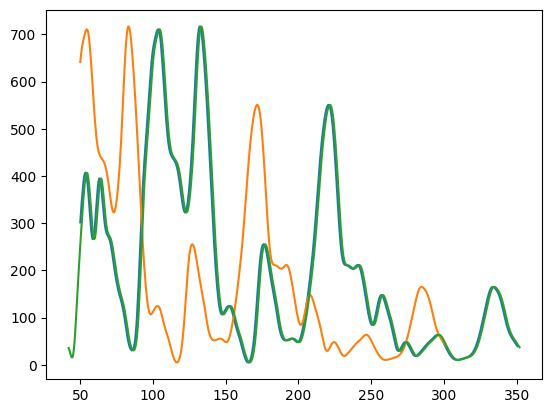

In [32]:
%matplotlib inline
plt.plot(calculator.target_grid, calculator.exp_spline(calculator.target_grid+1)[:,1])
plt.plot(calculator.target_grid, calculator.exp_spline(calculator.target_grid+50)[:,1])
plt.plot(exp_energies, aligned_exp_intensities[:,1])
plt.show()

# Intensity

In [ ]:
# Use first beam for plotting
plot_beam = 1

In [ ]:
# some displacements to play with
spaced_displacements = [
    np.array([[i*0.01-0.05, 0.0, 0.0],] +[[0.00, 0.0, 0.0],]*29)
    for i in range (11)
]

# Interpolation

In [ ]:
%matplotlib inline

theta: 0.0
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
phi: -0.0
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.78

Text(0.5, 1.0, 'Interpolated Intensity')

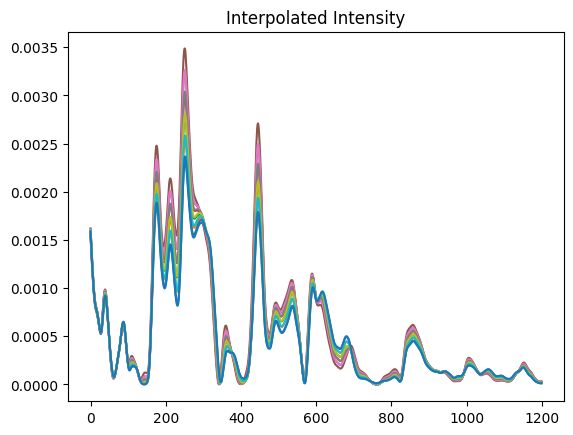

In [ ]:
plt.figure()
for d in spaced_displacements:
    plt.plot(calculator.interpolated(centered_vib_amps, d, deriv_deg=0)[:, 5])
plt.title("Interpolated Intensity")

theta: 0.0
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
phi: -0.0
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.78

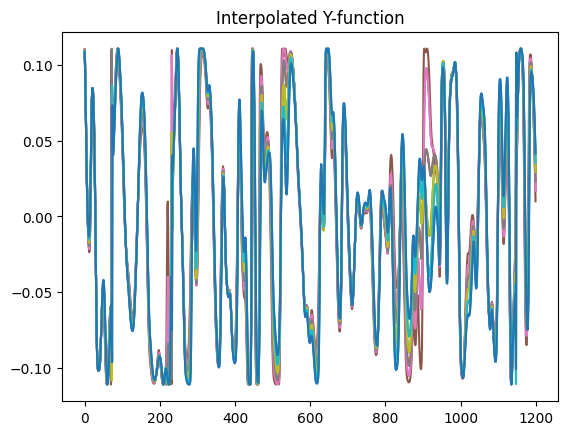

In [ ]:
from viperleed_jax.rfactor import pendry_y
plt.figure()
for d in spaced_displacements:
    intensity = calculator.interpolated(centered_vib_amps, d, deriv_deg=0)[:, plot_beam]
    deriv = calculator.interpolated(centered_vib_amps, d, deriv_deg=1)[:, plot_beam]
    plt.plot(pendry_y(intensity, deriv, 4.5))
plt.title("Interpolated Y-function")
plt.show()

KeyboardInterrupt: 

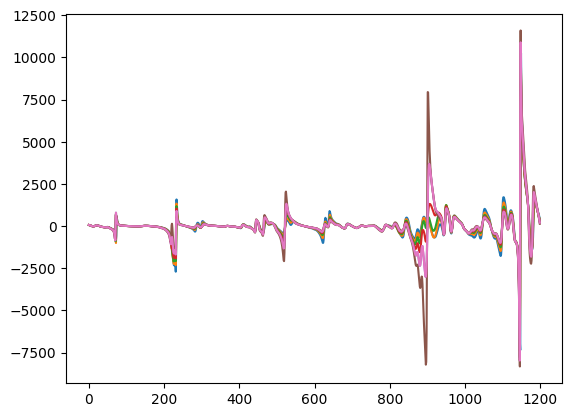

In [ ]:
from viperleed_jax.rfactor import y_ms
plt.figure()
for d in spaced_displacements:
    intensity = calculator.interpolated(centered_vib_amps, d, deriv_deg=0)[:, plot_beam]
    deriv = calculator.interpolated(centered_vib_amps, d, deriv_deg=1)[:, plot_beam]
    deriv2 = calculator.interpolated(centered_vib_amps, d, deriv_deg=2)[:, plot_beam]
    plt.plot(y_ms(intensity, deriv, deriv2, 4.5, 0.5))
plt.title("Interpolated Y-function")
plt.show()

# Rfactor

In [35]:
test_flat_param = np.array([0.5, 0.5, 0.5, 0.5, 0.5, 0.500]+ [0.5]*4) # displacements

In [36]:
calculator.parameter_transformer.unflatten_parameters(test_flat_param)

(0.0,
 Array([-0.011, -0.011, -0.04 , -0.04 , -0.04 , -0.04 , -0.04 , -0.04 ,
        -0.04 , -0.04 , -0.04 , -0.04 ,  0.041,  0.041,  0.015,  0.015,
         0.015,  0.015,  0.015,  0.015,  0.015,  0.015,  0.015,  0.015,
         0.015,  0.015,  0.015,  0.015,  0.015,  0.015], dtype=float64),
 Array([[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]], dtype=float64))

In [ ]:
v = jnp.array([0.089, 0.089, 0.06 , 0.06 , 0.06 , 0.06 , 0.06 , 0.06 , 0.06 ,
        0.06 , 0.06 , 0.06 , 0.141, 0.141, 0.115, 0.115, 0.115, 0.115,
        0.115, 0.115, 0.115, 0.115, 0.115, 0.115, 0.115, 0.115, 0.115,
        0.115, 0.115, 0.115])
calculator.R(v, jnp.zeros((30,3)))

theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi:

Array(0.19253827, dtype=float64)

In [ ]:
# Pendry R-factor
calculator.set_rfactor('pendry')

### $R_P$

In [ ]:
# compile time
%time calculator.R_from_reduced(test_flat_param)

theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi:

Array(0.30955779, dtype=float64)

In [ ]:
# excecution time
%timeit calculator.R_from_reduced(test_flat_param)

theta: 0.0
theta: 0.0
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
phi: -0.0
phi: -0.0
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795

In [ ]:
3.58 s ± 396 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)

In [ ]:
config.update("jax_debug_nans", True)
config.update("jax_disable_jit", True)

In [ ]:
calculator._delta_amplitude_from_reduced(test_flat_param).sum().real()

theta: 0.0
theta: 0.0
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
phi: -0.0
phi: -0.0
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795

TypeError: 'ArrayImpl' object is not callable

In [ ]:
jax.grad(lambda p:calculator._delta_amplitude_from_reduced(p).sum().real)(test_flat_param)

theta: 0.0
theta: 0.0
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
phi: -0.0
phi: -0.0
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795

FloatingPointError: invalid value (nan) encountered in jit(sqrt). Because jax_config.debug_nans.value and/or config.jax_debug_infs is set, the de-optimized function (i.e., the function as if the `jit` decorator were removed) was called in an attempt to get a more precise error message. However, the de-optimized function did not produce invalid values during its execution. This behavior can result from `jit` optimizations causing the invalid value to be produced. It may also arise from having nan/inf constants as outputs, like `jax.jit(lambda ...: jax.numpy.nan)(...)`. 

It may be possible to avoid the invalid value by removing the `jit` decorator, at the cost of losing optimizations. 

If you see this error, consider opening a bug report at https://github.com/google/jax.

### $\nabla R_P$

In [ ]:
# compile time
%time calculator.R_grad_from_reduced(test_flat_param)

theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
theta: 0.9523366378908563
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi: 0.7824795521375068
phi:

Array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -8.39015235e-06, -8.39015235e-06, -8.39015235e-06,
        0.00000000e+00,  0.00000000e+00], dtype=float64)

In [ ]:
from viperleed_jax.lib_math import cart_to_polar

cart_to_polar(np.array([0.0, 0.0, 0.0]))

(Array(0., dtype=float64), Array(0., dtype=float64), Array(0., dtype=float64))

In [ ]:
# execution time
# %time calculator.R_grad_from_reduced(test_flat_param)

### ($R_P$, $\nabla R_P$)

In [ ]:
# compile time
%time calculator.R_val_and_grad_from_reduced(test_flat_param,)

In [ ]:
# execution time
%timeit calculator.R_val_and_grad_from_reduced(test_flat_param,)

# Compare R-factors

In [ ]:
# move topmost atom

params = [np.array([0.5] + [0.1*i] + [0.5]*8) for i in range(11)]

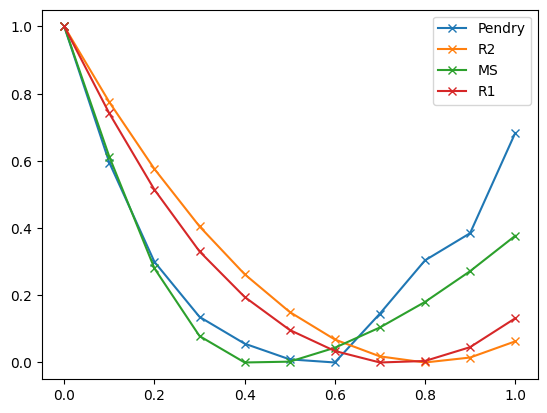

In [ ]:
def normalize(R):
    return [(r - min(R)) / (max(R) - min(R))  for r in R]

%matplotlib inline
plt.figure()
plt.plot([p[1] for p in params], normalize(R_P), marker='x', label='Pendry')
plt.plot([p[1] for p in params], normalize(R_2), marker='x', label='R2')
plt.plot([p[1] for p in params], normalize(R_MS), marker='x', label='MS')
plt.plot([p[1] for p in params], normalize(R_1), marker='x', label='R1')
#plt.plot([p for p in params], R_1, label='R1')
plt.legend()

In [ ]:
R_MS

[Array(0.99999782, dtype=float64),
 Array(0.9999948, dtype=float64),
 Array(0.99999222, dtype=float64),
 Array(0.99999066, dtype=float64),
 Array(0.99999005, dtype=float64),
 Array(0.99999007, dtype=float64),
 Array(0.99999039, dtype=float64),
 Array(0.99999086, dtype=float64),
 Array(0.99999145, dtype=float64),
 Array(0.99999216, dtype=float64),
 Array(0.99999298, dtype=float64)]

In [ ]:
first_atom_geo_index = 5
first_site_vib_index = 1

### Non-compressed parameters

In [ ]:
# compile time
%time calculator.R_pendry_val_and_grad(centered_vib_amps, centered_displacements, 0)

In [ ]:
calculator.R_pendry_val_and_grad(centered_vib_amps, centered_displacements, 0)

In [ ]:
R_arr = []
R_grad_arr = []
z_arr = []
for d in spaced_displacements:
    R, gradient = calculator.R_pendry_val_and_grad(centered_vib_amps, d)
    R_arr.append(R)
    R_grad_arr.append(gradient)
    z_arr.append(d[0][0])

In [ ]:
plt.figure()
plt.plot(z_arr, R_arr)

In [ ]:
plt.figure()
plt.plot(z_arr, [g[0,0] for g in R_grad_arr])
plt.plot(z_arr, [g[0,1] for g in R_grad_arr])

In [ ]:
plt.figure()
plt.plot(z_arr, [g[0,0] for g in R_grad_arr])
plt.plot(z_arr[:-1], jnp.diff(np.array(R_arr))/ (z_arr[1]-z_arr[0]))

# Optimization

In [ ]:
normalization_bounds = scipy.optimize.Bounds(lb=[0.0,]*10, ub=[1.0,]*10)

In [ ]:
def callback_print(intermediate_result):
    print(f"R={intermediate_result.fun}")
    if intermediate_result.fun <= 0.165:
        raise StopIteration

In [ ]:
%%time
centered_flat_param = np.concatenate([np.array([0.0]), # v0r
                                [0.089, 0.06, 0.141, 0.115], # vib_amps
                                np.zeros(5)] # displacements
                                 )
start_flat_param = np.concatenate([np.array([1.0]), # v0r
                                [0.089, 0.06, 0.141, 0.115], # vib_amps
                                [0.05, -0.03, -0.02, 0.06, 0.02]] # displacements
                                 )

scipy.optimize.minimize(
    fun=calculator.R_pendry_val_and_grad_from_flat,
    jac=True,
    x0=start_flat_param,
    method="BFGS", # recommended method for expensive functions with access to gradient
    options={'disp':True, 'return_all':True, },
    callback=callback_print
)

